# Fuzzy C-Means Clustering applied to Customer Analysis
Author: Amanda Lucas Pereira

ELE2399 Lógica Fuzzy 2021/2

# Importing packages

In [1]:
%reload_ext fuzzycmeans
from dataprep.eda import plot
import matplotlib.pyplot as plt
from fuzzycmeans import *
import pandas as pd
import numpy as np
import seaborn as sns
from fcmeans import FCM
from matplotlib import pyplot as plt


# Loading and pre-processing data

In [2]:
csv_path = 'marketing_campaign.csv'

In [3]:
df = get_dataframe(csv_path)
df.head()

> Found dataframe with 2240 lines.


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response\r
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0



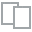
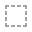
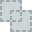
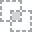
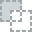
...
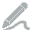
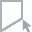
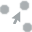
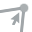
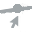

In [4]:
plot(df)

In [5]:
df = df.dropna()
print('> After dropping NaN values:', str(len(df.index)))

> After dropping NaN values: 2216


## Creating/Preprocessing features

### Age

In [6]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"]) # this column is set as an Object
most_recent_date = df["Dt_Customer"].max()
oldest_date = df["Dt_Customer"].min()
most_recent_date, oldest_date

(Timestamp('2014-12-06 00:00:00'), Timestamp('2012-01-08 00:00:00'))

Note que a data mais recente de cadastro de um novo consumidor é de Dezembro de 2014. Logo, consideraremos 2015 como referência para o cálculo da idade dos consumidores avaliados.

array([[<AxesSubplot:title={'center':'Age'}>]], dtype=object)

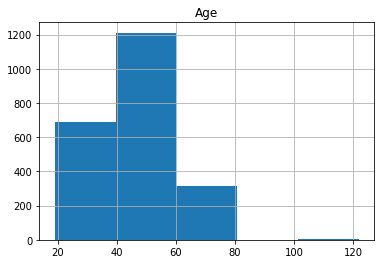

In [7]:
df["Age"] = df["Year_Birth"].apply(get_age, args=[2015])
df.hist(column="Age", bins=5)

In [8]:
df["Age"].min(), df["Age"].max(), np.unique(df["Age"])

(19,
 122,
 array([ 19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,  31,
         32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,  44,
         45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,  57,
         58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,  70,
         71,  72,  74,  75, 115, 116, 122]))

Pela célula anterior, notamos alguns outliers: registros a consumidores com mais de 100 anos. Esses dados serão desconsiderado na análise.

In [9]:
df = df[df.Age < 100]
np.unique(df["Age"])

array([19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52,
       53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69,
       70, 71, 72, 74, 75])

(19, 75)

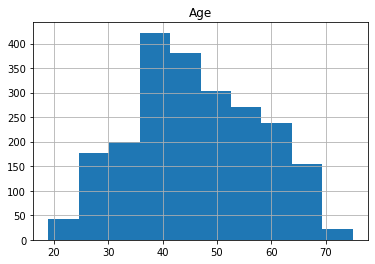

In [10]:
df.hist(column="Age", bins=10)
df.Age.min(), df.Age.max()

### Customer Time

Tempo de cadastro de um consumidor, considerando como referência a data mais recente de cadastro de um novo.

array([[<AxesSubplot:title={'center':'Customer_Time'}>]], dtype=object)

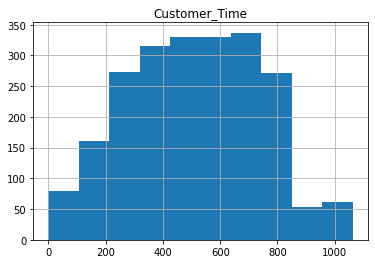

In [11]:
df["Customer_Time"] = df["Dt_Customer"].apply(get_customer_time, args=[most_recent_date])
df.hist(column="Customer_Time", bins=10)

### Total Children

Número de filhos: número de crianças + número de adolescentes.

array([[<AxesSubplot:title={'center':'Total_Children'}>]], dtype=object)

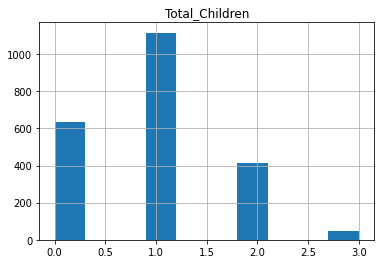

In [12]:
df["Total_Children"] = df["Kidhome"] + df["Teenhome"]
df.hist(column="Total_Children", bins=10)

### Education

In [13]:
df["Education"].value_counts()

Graduation    1116
PhD            480
Master         365
2n Cycle       198
Basic           54
Name: Education, dtype: int64

O algoritmo precisa trabalhar com variáveis numéricas ao invés de categóricas. A função `get_educational_group` realiza o encoding das categorias nominais do atributo "Education".

In [14]:
df["Education"] = df["Education"].apply(get_educational_group)

### Marital Status / Sharing_Home

In [15]:
df["Marital_Status"].value_counts()

Married     857
Together    572
Single      470
Divorced    231
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

As categorias serão combinadas em uma nova variável "Sharing_Home": 0 , que corresponde a Marital_Status = ['Alone', 'Absurd', 'YOLO', 'Single', 'Divorced', 'Widow'];
1 = ['Together', 'Married'].

In [16]:
df["Sharing_Home"] = df["Marital_Status"].apply(get_sharing_group)

Os dados precisam ser transformados em categorias númericas através do processo de enconding. A função `get_marital_group` realiza esse processo, atribuindo um número a cada categoria original do atributo.

In [17]:
df["Marital_Status"] = df["Marital_Status"].apply(get_marital_group)

### Total Spent

array([[<AxesSubplot:title={'center':'Total_Spent'}>]], dtype=object)

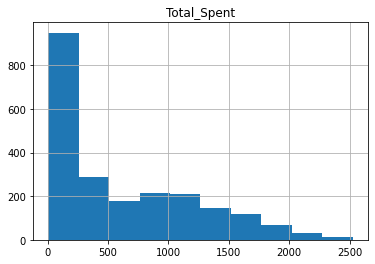

In [18]:
df["Total_Spent"] = df["MntWines"] + df["MntFruits"] + df["MntMeatProducts"] + df["MntFishProducts"] + df["MntSweetProducts"] + df["MntGoldProds"]
df.hist(column="Total_Spent", bins=10)

### Income

array([[<AxesSubplot:title={'center':'Income'}>]], dtype=object)

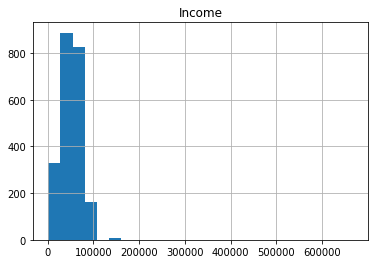

In [19]:
df.hist(column="Income", bins=25)

Do histograma gerado, aparentemente há outliers nessa série. Vamos remove-los.

In [20]:
df = remove_outlier(df, "Income")
print("Número de itens após remoção dos outliers:", str(len(df.index)))

Número de itens após remoção dos outliers: 2205


(1730.0, 113734.0)

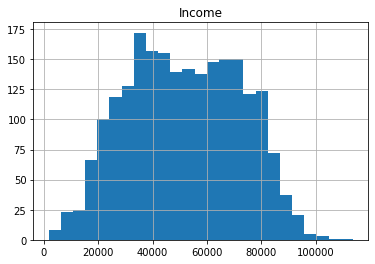

In [21]:
df.hist(column="Income", bins=25)
df.Income.min(), df.Income.max()

### Dropping some columns

In [22]:
cols_to_drop = ["Year_Birth", "Dt_Customer", "ID", "Z_CostContact", "Z_Revenue"]
df_filtered = df.drop(columns=cols_to_drop)
print('Total columns:', len(df_filtered.columns))

Total columns: 29


In [23]:
df_filtered.rename(columns={'Response\r':'Response'}, inplace=True)

## Visualizing relationships between variables

In [24]:
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,2,0,58138.0,0,0,58,635,88,546,172,...,0,0,0,0,1,58,971,0,0,1617
1,2,0,46344.0,1,1,38,11,1,6,2,...,0,0,0,0,0,61,125,2,0,27
2,2,3,71613.0,0,0,26,426,49,127,111,...,0,0,0,0,0,50,472,0,1,776
3,2,3,26646.0,1,0,26,11,4,20,10,...,0,0,0,0,0,31,65,1,1,53
4,4,4,58293.0,1,0,94,173,43,118,46,...,0,0,0,0,0,34,321,1,1,422


<Figure size 432x288 with 0 Axes>

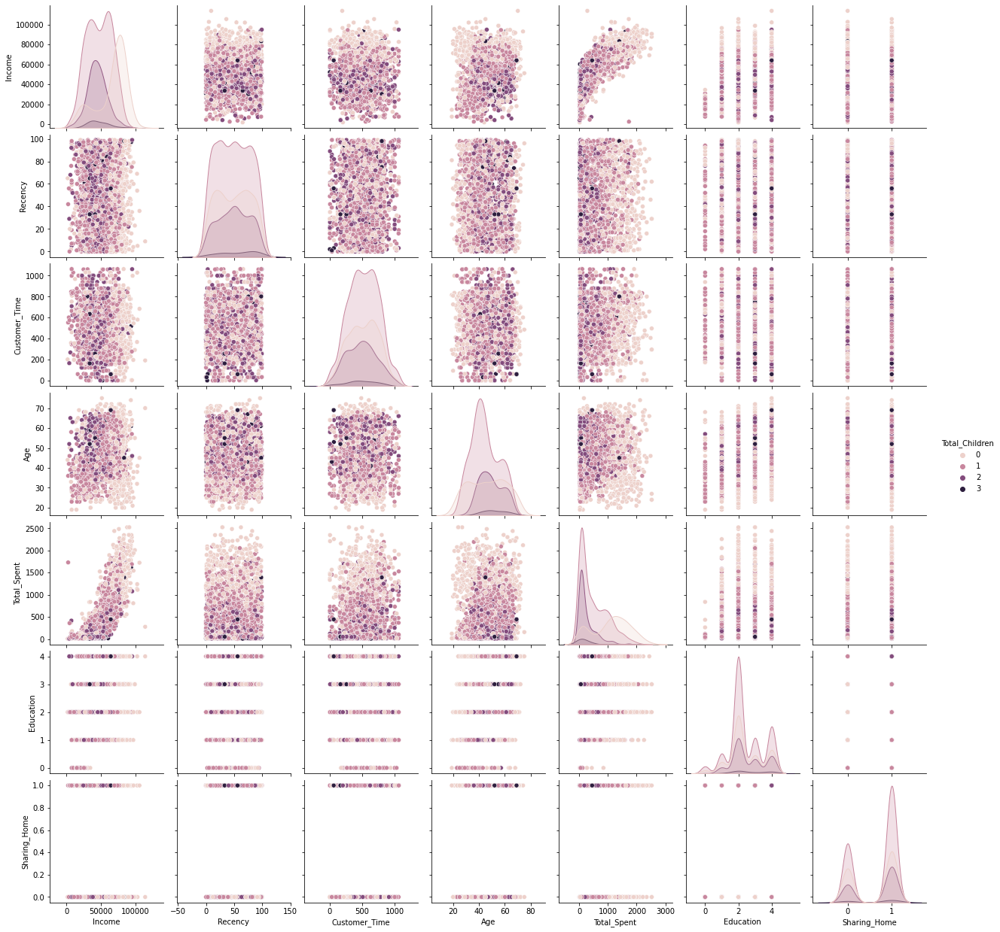

<Figure size 432x288 with 0 Axes>

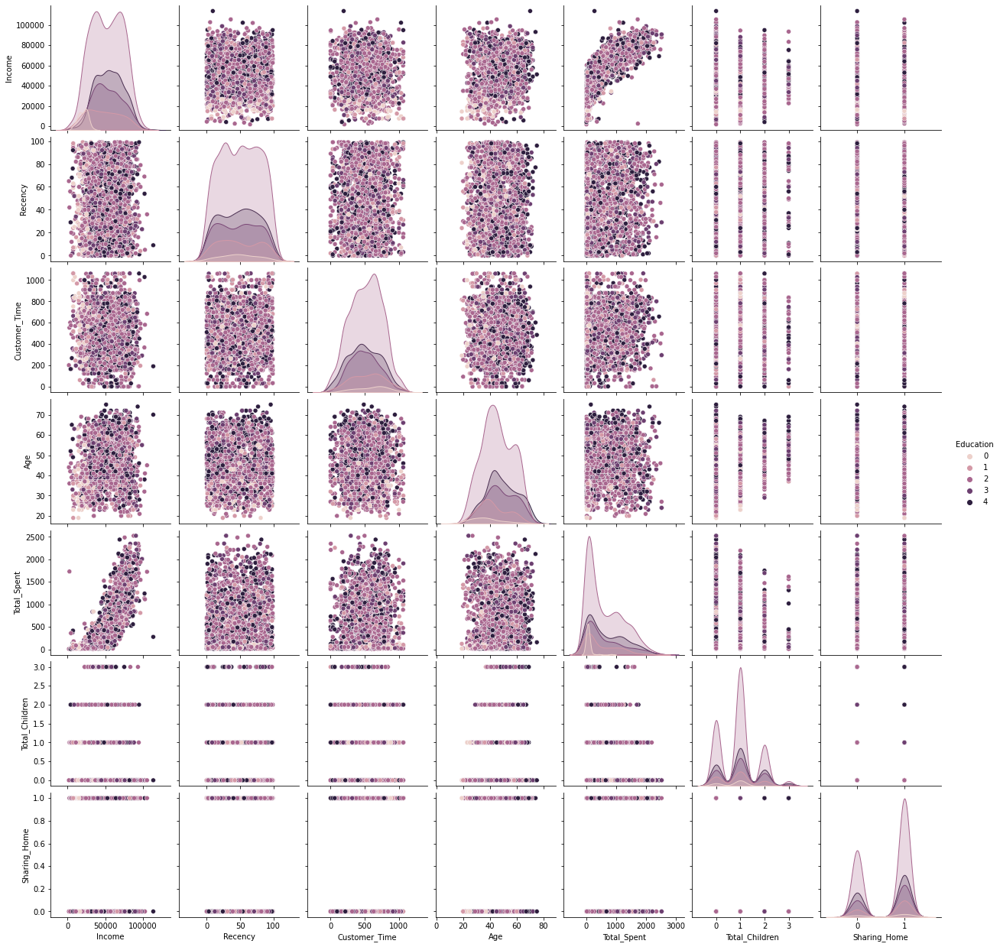

<Figure size 432x288 with 0 Axes>

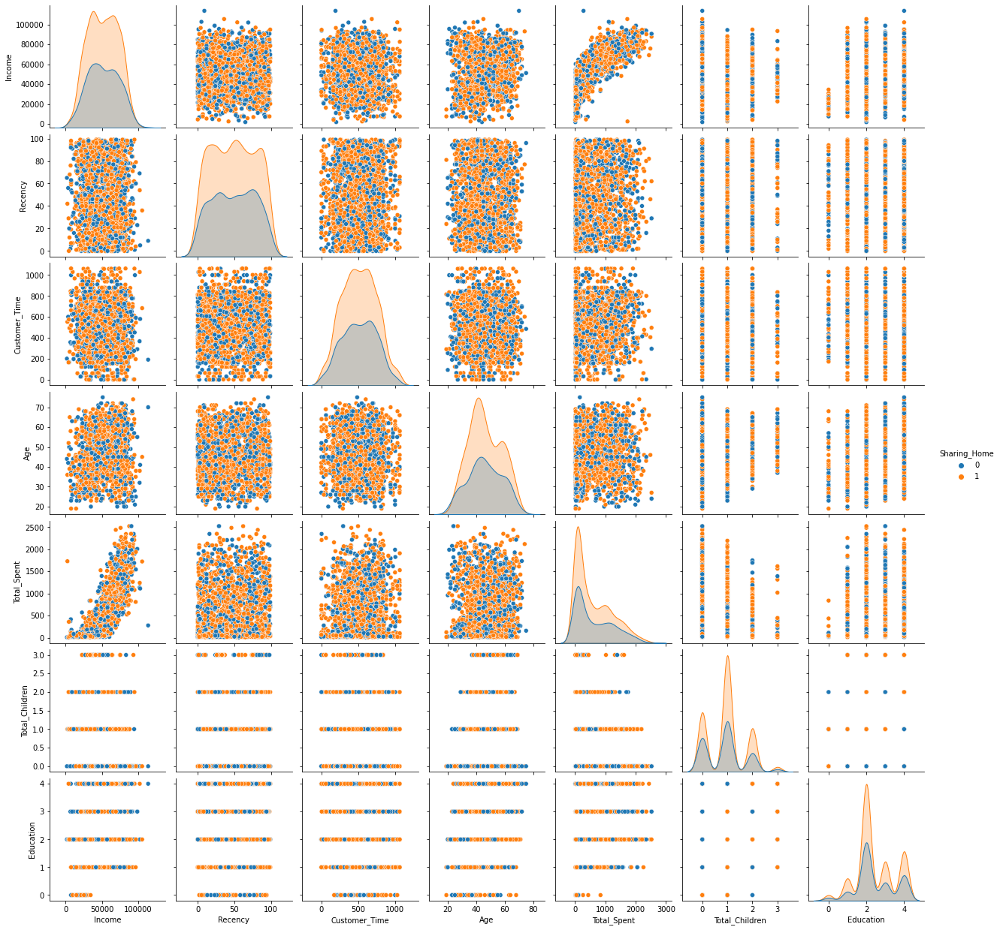

In [25]:
to_plot = [ "Income", "Recency", "Customer_Time", "Age", "Total_Spent", "Total_Children", "Education", "Sharing_Home"]
vis = ["Total_Children", "Education", "Sharing_Home"]
for var in vis:
    plt.figure()
    sns.pairplot(df[to_plot], hue=var)
    plt.show()

Dos gráficos acima, a variável "Total_Children" parece 'clusterizar' os pontos nos gráficos que relacionam Income e Total_Spent. Educação e Sharing_Home não parecem ter esse efeito.

<AxesSubplot:>

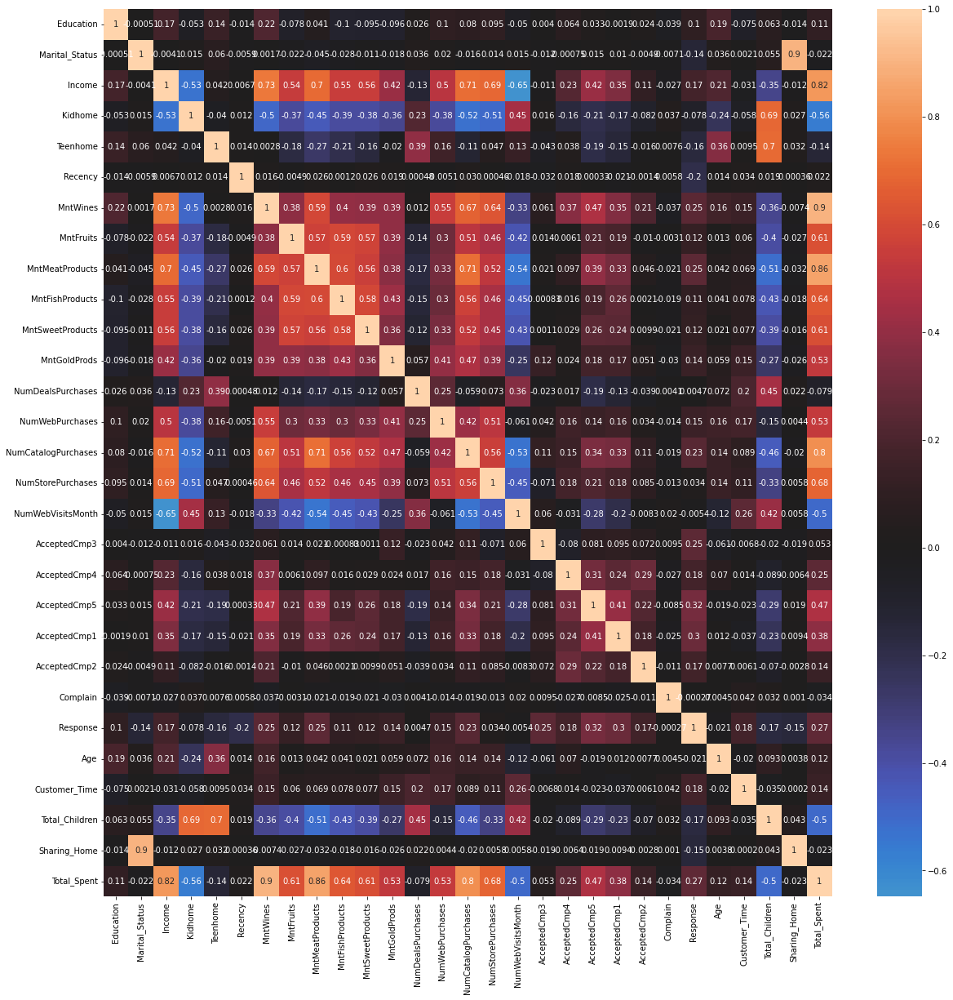

In [26]:
corrmat= df_filtered.corr()
plt.figure(figsize=(20,20))  
sns.heatmap(corrmat,annot=True, center=0)

Analizando a matriz de correlações, parece haver uma relação entre as variáveis:
- Total_Spent e MntWines
- Total_Spent e MntMeatProducts
- Total_Spent e NumCatalogPurchases
- Total_Spent e Income

## Final Dataframe

In [27]:
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,2,0,58138.0,0,0,58,635,88,546,172,...,0,0,0,0,1,58,971,0,0,1617
1,2,0,46344.0,1,1,38,11,1,6,2,...,0,0,0,0,0,61,125,2,0,27
2,2,3,71613.0,0,0,26,426,49,127,111,...,0,0,0,0,0,50,472,0,1,776
3,2,3,26646.0,1,0,26,11,4,20,10,...,0,0,0,0,0,31,65,1,1,53
4,4,4,58293.0,1,0,94,173,43,118,46,...,0,0,0,0,0,34,321,1,1,422



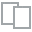
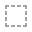
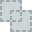
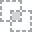
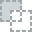
...
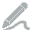
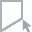
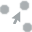
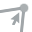
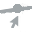

In [28]:
plot(df_filtered)

## Normalizing features

### Shuffle Dataframe

In [29]:
df_filtered = df_filtered.sample(frac = 1)
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
1226,4,0,61284.0,0,0,76,618,15,106,20,...,0,0,0,0,0,60,361,0,0,811
336,2,2,75693.0,0,0,10,797,153,293,72,...,1,1,0,0,1,47,907,0,0,1442
2064,2,4,67445.0,0,1,63,757,80,217,29,...,0,0,0,0,0,41,728,1,1,1174
1920,1,0,31878.0,0,1,7,23,4,5,10,...,0,0,0,0,0,38,167,1,0,70
2046,2,4,53154.0,0,1,50,129,0,21,0,...,0,0,0,0,0,56,91,1,1,158


### Split Train/Test Data

Criando uma coluna no dataframe para representar se a amostra pertence ao grupo de treino ou de teste. O grupo de treino será usado para definir os melhores parâmetros para a clusterização; o grupo de teste será utilizado para avaliar a melhor solução encontrada após a etapa de treinamento.

In [30]:
total_samples = (len(df_filtered.index))
nb_train = int(0.8*total_samples)

split = np.zeros(total_samples)
split[nb_train:] = 1
df_filtered["Split"] = split
df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent,Split
1226,4,0,61284.0,0,0,76,618,15,106,20,...,0,0,0,0,60,361,0,0,811,0.0
336,2,2,75693.0,0,0,10,797,153,293,72,...,1,0,0,1,47,907,0,0,1442,0.0
2064,2,4,67445.0,0,1,63,757,80,217,29,...,0,0,0,0,41,728,1,1,1174,0.0
1920,1,0,31878.0,0,1,7,23,4,5,10,...,0,0,0,0,38,167,1,0,70,0.0
2046,2,4,53154.0,0,1,50,129,0,21,0,...,0,0,0,0,56,91,1,1,158,0.0


Fazendo o split

In [31]:
df_train = df_filtered[df_filtered.Split == 0.0]
df_test = df_filtered[df_filtered.Split == 1.0]
df_train.drop(columns=['Split'], inplace=True)
df_test.drop(columns=['Split'], inplace=True)
print('Dados para treinamento:', len(df_train.index))
print('Dados para teste:', len(df_test.index))

Dados para treinamento: 1764
Dados para teste: 441


/usr/local/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


As colunas do dataframe devem ser normalizadas antes de prosseguir para os testes com o FCM. Para isso, será utilizado o `StandardScaler()`. O fit do scaler deve ser realizado considerando apenas os dados de treinamento. O scaler gerado deve ser reutilizado para normalização dos dados para teste.

In [32]:
from sklearn.preprocessing import StandardScaler

In [33]:
scaler = StandardScaler()
scaler.fit(df_train)
scaled_df_train = pd.DataFrame(scaler.transform(df_train), columns= df_train.columns)
scaled_df_train.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,1.523535,-1.680067,0.456231,-0.818592,-0.938799,0.929339,0.918847,-0.292964,-0.277474,-0.333358,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,1.193779,-0.656257,-1.265641,-1.380614,0.329969
1,-0.463538,-0.382786,1.152248,-0.818592,-0.938799,-1.348596,1.448529,3.138693,0.568402,0.587009,...,3.590232,3.701351,-0.12231,-0.098646,2.336993,0.073567,1.656374,-1.265641,-1.380614,1.375322
2,-0.463538,0.914495,0.753834,-0.818592,0.915670,0.480655,1.330165,1.323397,0.224624,-0.174064,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,-0.443454,0.898204,0.071240,0.724315,0.931337
3,-1.457074,-1.680067,-0.964207,-0.818592,0.915670,-1.452139,-0.841829,-0.566501,-0.734337,-0.510352,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,-0.701964,-1.477961,0.071240,-1.380614,-0.897618
4,-0.463538,0.914495,0.063516,-0.818592,0.915670,0.031971,-0.528163,-0.665970,-0.661963,-0.687346,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,0.849098,-1.799865,0.071240,0.724315,-0.751831


Os dados de teste serão normalizados com as mesmas estatísticas descritivas dos dados de treino.

In [34]:
scaled_df_test = pd.DataFrame(scaler.transform(df_test), columns= df_test.columns)
scaled_df_test.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,-0.463538,0.914495,-1.421117,-0.818592,-0.938799,0.860311,-0.821115,-0.591368,-0.544355,-0.351058,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.4279,0.504418,0.343342,-1.265641,0.724315,-0.745205
1,1.523535,-1.680067,0.165245,-0.818592,0.915670,1.101910,1.531385,-0.467033,-0.517214,-0.492653,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.4279,-0.271114,0.881261,0.071240,-1.380614,0.873354
2,0.529999,-0.382786,-0.263214,-0.818592,0.915670,0.239056,-0.628773,-0.317831,-0.467457,-0.651947,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.4279,1.193779,-1.274652,0.071240,-1.380614,-0.645805
3,1.523535,0.914495,-0.832915,1.039833,-0.938799,-0.037058,-0.868461,-0.665970,-0.747908,-0.687346,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.4279,-0.443454,0.364520,0.071240,0.724315,-0.975481
4,-0.463538,-0.382786,1.486997,-0.818592,-0.938799,0.308084,-0.306229,0.179511,0.165820,2.356948,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.4279,1.452290,-0.402121,-1.265641,-1.380614,0.543678


In [35]:
df_filtered.drop(columns=['Split'], inplace=True)
scaled_df_filtered = pd.DataFrame(scaler.transform(df_filtered), columns=df_filtered.columns)
scaled_df_filtered.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Age,Customer_Time,Total_Children,Sharing_Home,Total_Spent
0,1.523535,-1.680067,0.456231,-0.818592,-0.938799,0.929339,0.918847,-0.292964,-0.277474,-0.333358,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,1.193779,-0.656257,-1.265641,-1.380614,0.329969
1,-0.463538,-0.382786,1.152248,-0.818592,-0.938799,-1.348596,1.448529,3.138693,0.568402,0.587009,...,3.590232,3.701351,-0.12231,-0.098646,2.336993,0.073567,1.656374,-1.265641,-1.380614,1.375322
2,-0.463538,0.914495,0.753834,-0.818592,0.915670,0.480655,1.330165,1.323397,0.224624,-0.174064,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,-0.443454,0.898204,0.071240,0.724315,0.931337
3,-1.457074,-1.680067,-0.964207,-0.818592,0.915670,-1.452139,-0.841829,-0.566501,-0.734337,-0.510352,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,-0.701964,-1.477961,0.071240,-1.380614,-0.897618
4,-0.463538,0.914495,0.063516,-0.818592,0.915670,0.031971,-0.528163,-0.665970,-0.661963,-0.687346,...,-0.278534,-0.270172,-0.12231,-0.098646,-0.427900,0.849098,-1.799865,0.071240,0.724315,-0.751831


# Fuzzy C Means: Clustering

In [36]:
data_train = scaled_df_train.to_numpy()
data_test = scaled_df_test.to_numpy()

In [37]:
n_clusters_list = np.arange(2, 15)
n_clusters_list

array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])

In [38]:
eps = 1e-9

## Baseline: Raw data

In [39]:
m_1 = m_estimate(data_train)
print('Estimated m:', m_1)

Estimated m: 1.0885862106593263


In [40]:
models_1 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_1, error=eps)
    fcm.fit(data_train)
    models_1.append(fcm)

In [41]:
pc_list_1, pec_list_1, fcm_centers_1, fcm_labels_1, fcm_soft_labels_1 = apply_fcm_test(n_clusters_list, models_1, data_train)

n_clusters = 2, PC = 0.481, PEC = 0.045
n_clusters = 3, PC = 0.307, PEC = 0.063
n_clusters = 4, PC = 0.225, PEC = 0.064
n_clusters = 5, PC = 0.178, PEC = 0.058
n_clusters = 6, PC = 0.147, PEC = 0.052
n_clusters = 7, PC = 0.125, PEC = 0.048
n_clusters = 8, PC = 0.111, PEC = 0.039
n_clusters = 9, PC = 0.098, PEC = 0.037
n_clusters = 10, PC = 0.088, PEC = 0.034
n_clusters = 11, PC = 0.080, PEC = 0.030
n_clusters = 12, PC = 0.074, PEC = 0.027
n_clusters = 13, PC = 0.067, PEC = 0.029
n_clusters = 14, PC = 0.064, PEC = 0.021


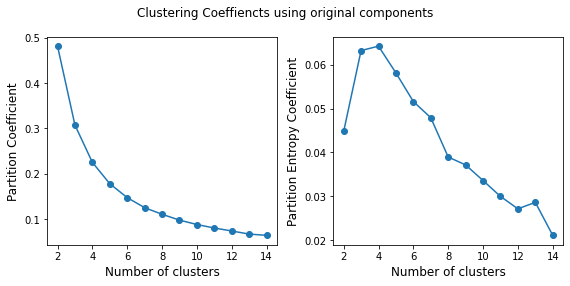

In [42]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using original components')
ax1.plot(n_clusters_list, pc_list_1, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_1, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

## PCA + FCM

### PCA: 2 principal components (p = 2)

In [43]:
p = 2 

In [44]:
reduced_df_train_2, pca_2 = apply_pca(data_train, number_components=p)
reduced_df_test_2, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_2)
pca_2.explained_variance_ratio_

     count          mean       std       min       25%       50%       75%  \
c0  1764.0  2.273314e-16  2.852744 -5.624012 -2.544217 -0.842455  2.357702   
c1  1764.0 -4.405647e-17  1.562276 -3.553226 -1.272809 -0.183641  1.092523   

         max  
c0  8.468757  
c1  5.712970  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0 -0.146756  2.779193 -4.587937 -2.635215 -0.953637  1.880220   
c1  441.0 -0.050543  1.586649 -3.183249 -1.356971 -0.152909  0.956382   

         max  
c0  7.735485  
c1  5.732432  


array([0.28046662, 0.08411461])

In [45]:
m_2 = m_estimate(reduced_df_train_2)
print('Estimated m:', m_2)

Estimated m: 6.900714330982995


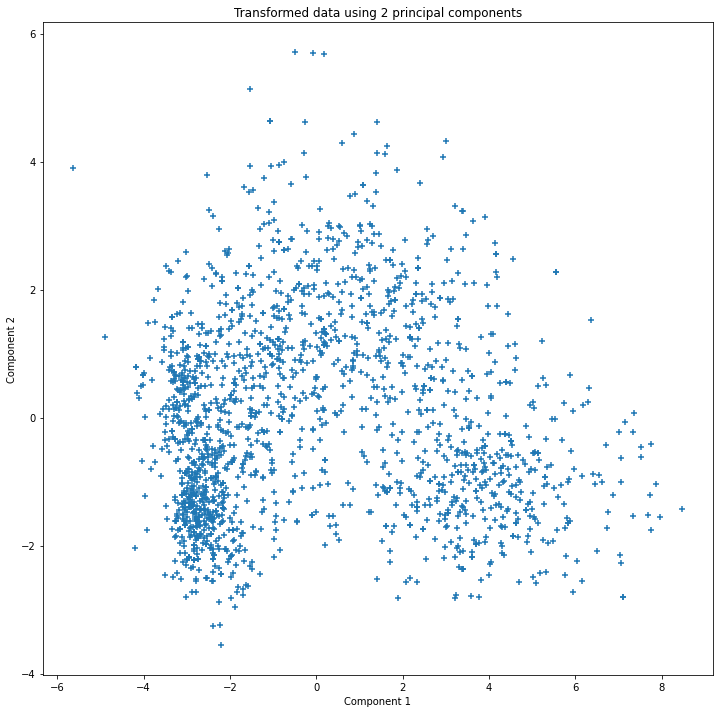

In [46]:
fig = plt.figure(figsize=(12,12))
plt.scatter(reduced_df_train_2[reduced_df_train_2.columns[0]], reduced_df_train_2[reduced_df_train_2.columns[1]], marker="+")
plt.title('Transformed data using %d principal components' % p)
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.show()

In [47]:
reduced_df_np_2 = reduced_df_train_2.to_numpy()
reduced_df_np_test_2 = reduced_df_test_2.to_numpy()

In [48]:
models_2 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_2, error=eps)
    fcm.fit(reduced_df_np_2)
    models_2.append(fcm)

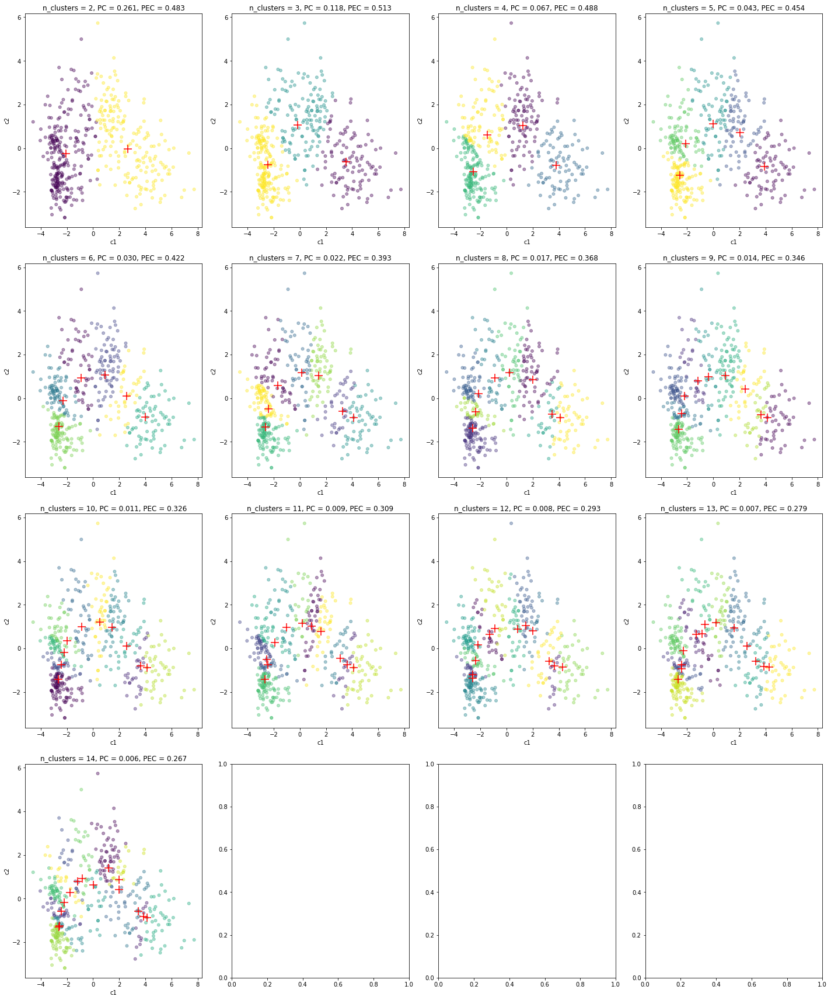

In [49]:
pc_list_2, pec_list_2, fcm_centers_2, fcm_labels_2, fcm_soft_labels_2 = apply_fcm_test(n_clusters_list, models_2, reduced_df_np_test_2)

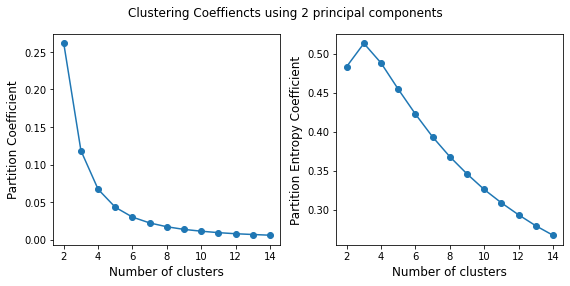

In [50]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_2, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_2, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

### PCA:  3 principal components (p = 3)

In [51]:
p = 3

In [52]:
reduced_df_train_3, pca_3 = apply_pca(data_train, number_components=p)
reduced_df_test_3, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_3)

     count          mean       std       min       25%       50%       75%  \
c0  1764.0  6.923159e-17  2.852744 -5.624016 -2.544216 -0.842455  2.357703   
c1  1764.0 -1.241763e-16  1.562275 -3.553542 -1.272250 -0.184387  1.092614   
c2  1764.0 -1.365751e-17  1.415161 -2.829502 -1.044122 -0.452131  1.002606   

         max  
c0  8.468760  
c1  5.713730  
c2  6.458822  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0 -0.146756  2.779193 -4.587942 -2.635215 -0.953638  1.880219   
c1  441.0 -0.050575  1.586592 -3.183828 -1.355832 -0.152567  0.956278   
c2  441.0  0.101345  1.396598 -2.741446 -0.955943 -0.224941  1.186657   

         max  
c0  7.735486  
c1  5.733883  
c2  5.124970  


In [53]:
m_3 = m_estimate(reduced_df_train_3)
print('Estimated m:', m_3)

Estimated m: 3.6974460233452553


In [54]:
pca_3.explained_variance_ratio_

array([0.28046662, 0.08411422, 0.06901601])

/Users/amanda/Library/Python/3.7/lib/python/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  


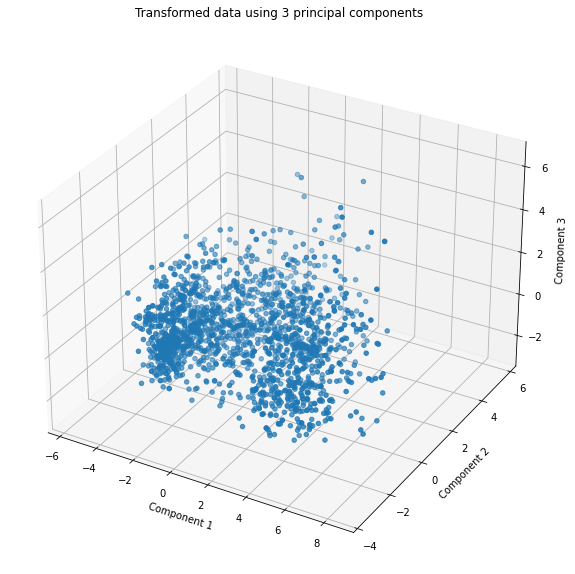

In [55]:
fig = plt.figure(figsize=(10,10))
ax = fig.gca(projection='3d')
#ax = fig.add_subplot(111, projection="3d")
ax.scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[1]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="o")
ax.set_title('Transformed data using %d principal components' % p)
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.show()

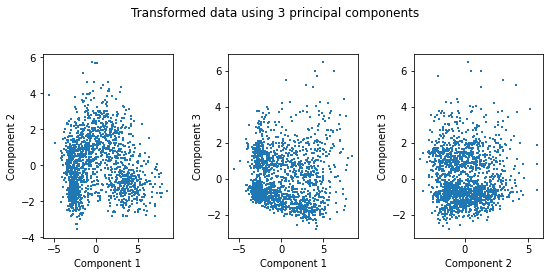

In [56]:
fig, axs = plt.subplots(1, 3, figsize=plt.figaspect(0.5)) #figsize=(18, 9))
fig.suptitle('Transformed data using %d principal components' % p)
axs[0].scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[1]], marker="+", s=3)
axs[0].set_xlabel('Component 1')
axs[0].set_ylabel('Component 2')
axs[1].scatter(reduced_df_train_3[reduced_df_train_3.columns[0]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="+", s=3)
axs[1].set_xlabel('Component 1')
axs[1].set_ylabel('Component 3')
axs[2].scatter(reduced_df_train_3[reduced_df_train_3.columns[1]], reduced_df_train_3[reduced_df_train_3.columns[2]], marker="+", s=3)
axs[2].set_xlabel('Component 2')
axs[2].set_ylabel('Component 3')
fig.tight_layout(pad=2)
plt.show()

In [57]:
reduced_df_np_3 = reduced_df_train_3.to_numpy()
reduced_df_np_test_3 = reduced_df_test_3.to_numpy()
models_3 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_3, error=eps)
    fcm.fit(reduced_df_np_3)
    models_3.append(fcm)

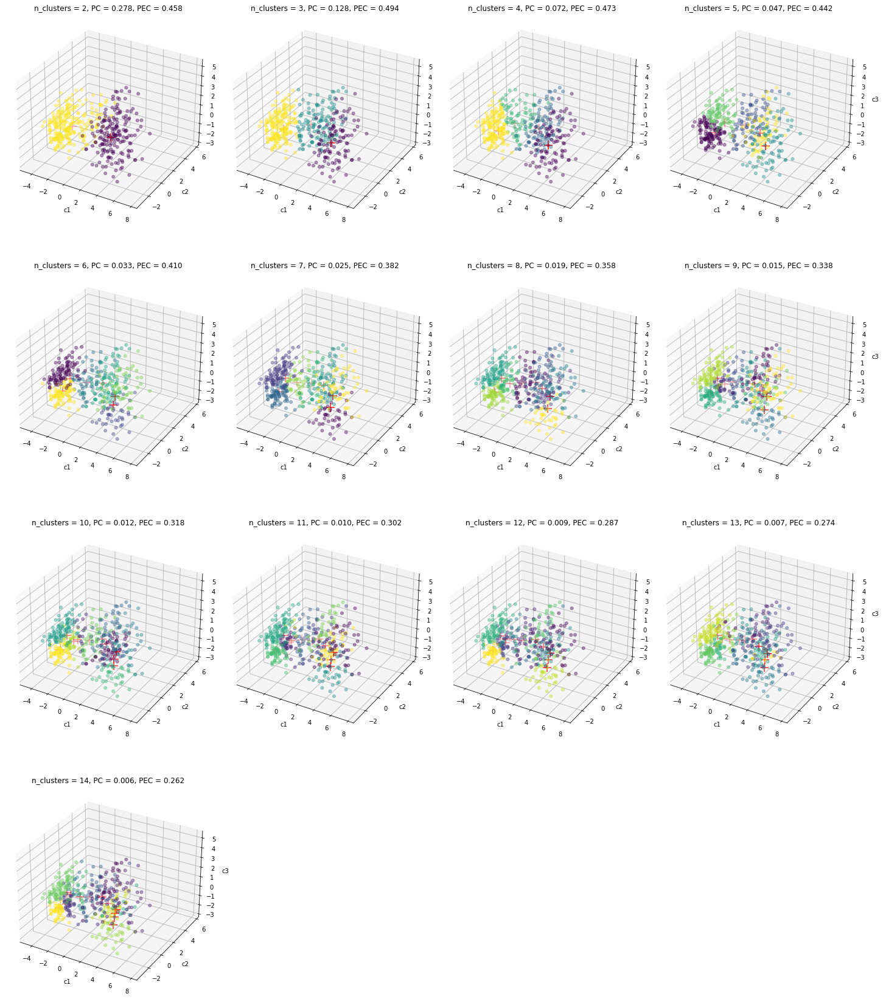

In [58]:
pc_list_3, pec_list_3, fcm_centers_3, fcm_labels_3, fcm_soft_labels_3 = apply_fcm_test(n_clusters_list, models_3, reduced_df_np_test_3)

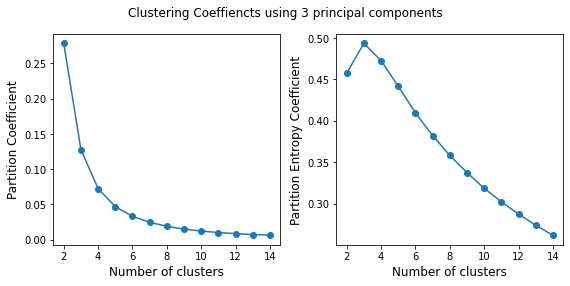

In [59]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_3, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_3, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

###  PCA:  Using 5 principal components (p = 5)

In [60]:
p = 5

In [61]:
reduced_df_train_5, pca_5 = apply_pca(data_train, number_components=p)
reduced_df_test_5, _ = apply_pca(data_test, number_components=p, pca_fitted=pca_5)

     count          mean       std       min       25%       50%       75%  \
c0  1764.0  1.825197e-16  2.852744 -5.624015 -2.544213 -0.842456  2.357704   
c1  1764.0  4.109839e-17  1.562276 -3.552966 -1.273174 -0.183786  1.092159   
c2  1764.0  3.209828e-17  1.415172 -2.832264 -1.043865 -0.450222  0.997260   
c3  1764.0  5.085375e-17  1.362750 -4.097346 -0.894678  0.027253  0.746017   
c4  1764.0  4.594460e-17  1.289265 -3.597813 -0.900758  0.011761  0.817391   

         max  
c0  8.468759  
c1  5.713041  
c2  6.455059  
c3  7.005370  
c4  4.589153  
Fitting data using provided PCA object.
    count      mean       std       min       25%       50%       75%  \
c0  441.0 -0.146756  2.779193 -4.587942 -2.635215 -0.953637  1.880218   
c1  441.0 -0.050540  1.586673 -3.182870 -1.356548 -0.153021  0.956050   
c2  441.0  0.101330  1.396390 -2.731659 -0.954434 -0.225561  1.194247   
c3  441.0 -0.069851  1.332783 -3.045157 -0.978619 -0.092070  0.682036   
c4  441.0 -0.035127  1.201371 -2.948

In [62]:
m_5 = m_estimate(reduced_df_train_5)
print('Estimated m:', m_5)

Estimated m: 2.0419517499444746


In [63]:
pca_5.explained_variance_ratio_

array([0.28046662, 0.08411455, 0.06901955, 0.06400095, 0.05728368])

In [64]:
reduced_df_np_5 = reduced_df_train_5.to_numpy()
reduced_df_np_test_5 = reduced_df_test_5.to_numpy()
models_5 = list()
for n_clusters in n_clusters_list:
    fcm = FCM(n_clusters = n_clusters, m = m_5, error=eps)
    fcm.fit(reduced_df_np_5)
    models_5.append(fcm)

In [65]:
pc_list_5, pec_list_5, fcm_centers_5, fcm_labels_5, fcm_soft_labels_5 = apply_fcm_test(n_clusters_list, models_5, reduced_df_np_test_5)

n_clusters = 2, PC = 0.337, PEC = 0.361
n_clusters = 3, PC = 0.165, PEC = 0.413
n_clusters = 4, PC = 0.097, PEC = 0.405
n_clusters = 5, PC = 0.068, PEC = 0.377
n_clusters = 6, PC = 0.051, PEC = 0.347
n_clusters = 7, PC = 0.040, PEC = 0.325
n_clusters = 8, PC = 0.032, PEC = 0.306
n_clusters = 9, PC = 0.026, PEC = 0.290
n_clusters = 10, PC = 0.022, PEC = 0.272
n_clusters = 11, PC = 0.019, PEC = 0.259
n_clusters = 12, PC = 0.016, PEC = 0.246
n_clusters = 13, PC = 0.014, PEC = 0.235
n_clusters = 14, PC = 0.012, PEC = 0.225


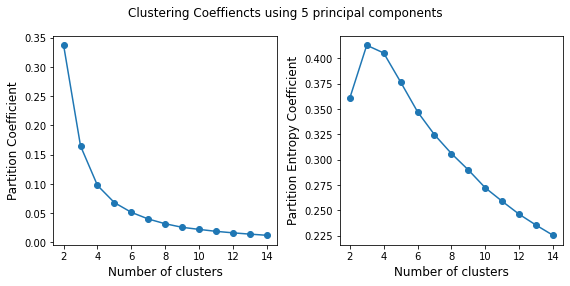

In [66]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
fig.suptitle('Clustering Coeffiencts using %d principal components' % p)
ax1.plot(n_clusters_list, pc_list_5, marker="o")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax2.plot(n_clusters_list, pec_list_5, marker="o")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
fig.tight_layout(pad=1)
plt.show()

### Comparing PC and PE for different values of principal components

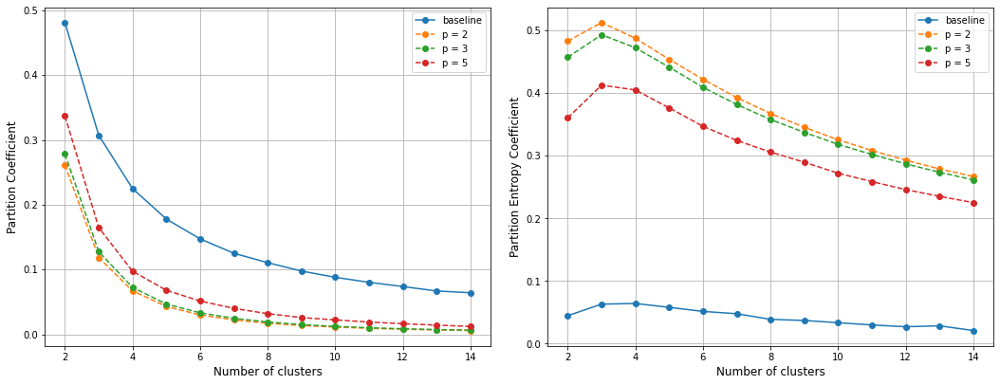

In [67]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))#figsize=plt.figaspect(0.5))
ax1.plot(n_clusters_list, pc_list_1, marker="o", label='baseline')
ax1.plot(n_clusters_list, pc_list_2, marker="o", label='p = 2', linestyle ="--")
ax1.plot(n_clusters_list, pc_list_3, marker="o", label='p = 3', linestyle ="--")
ax1.plot(n_clusters_list, pc_list_5, marker="o", label='p = 5', linestyle ="--")
ax1.set_xlabel('Number of clusters', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.legend()
ax1.grid(True)
ax2.plot(n_clusters_list, pec_list_1, marker="o", label='baseline')
ax2.plot(n_clusters_list, pec_list_2, marker="o", label='p = 2', linestyle ="--")
ax2.plot(n_clusters_list, pec_list_3, marker="o", label='p = 3', linestyle ="--")
ax2.plot(n_clusters_list, pec_list_5, marker="o", label='p = 5', linestyle ="--")
ax2.set_xlabel('Number of clusters', fontsize=12)
ax2.set_ylabel('Partition Entropy Coefficient', fontsize=12)
ax2.legend()
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

Os melhores valores de PC e PEC foram obtidos com os dados originais. Para gerar uma comparação com o baseline, foi escolhido o método que utiliza 3 componentes principais, por questão de facilitar a visualização e não apresentar resultado tão inferior quanto o que mais se aproxima do baseline -- p = 5. Analisando as curvas, um bom número de clusters para esse conjunto de dados parece ser c = 2 ou c = 4. 

## EXPERIMENTO 1: Usando c = 2 (Baseline e PCA, p = 3)

In [68]:
df_filtered_ = df_filtered.copy()

Selecionando os modelos para os quais c = 2:

In [69]:
best_model_1 = models_1[0]
best_model_3 = models_3[0]
models = [best_model_1, best_model_3]
n_clusters = 2
fcm_soft_labels_list = []
fcm_hard_labels_list = []

Aplicando os modelos em todo o conjunto de treinamento.

In [70]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0 -0.029351  2.838169 -5.624016 -2.558098 -0.854907  2.302478   
c1  2205.0 -0.010115  1.566937 -3.553542 -1.295151 -0.181817  1.082059   
c2  2205.0  0.020269  1.411735 -2.829502 -1.028010 -0.408993  1.045901   

         max  
c0  8.468760  
c1  5.733883  
c2  6.458822  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [71]:
dfs_list = [scaled_df_array, reduced_df_array_3]

In [72]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0 -0.029351  2.838169 -5.624016 -2.558098 -0.854907  2.302478   
c1  2205.0 -0.010115  1.566937 -3.553542 -1.295151 -0.181817  1.082059   
c2  2205.0  0.020269  1.411735 -2.829502 -1.028010 -0.408993  1.045901   

         max  
c0  8.468760  
c1  5.733883  
c2  6.458822  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [73]:
for (i, model, df) in zip([1, 2], models, dfs_list):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    fcm_centers = model.centers
    fcm_labels = model.predict(df)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(df)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 1
n_clusters = 2, PC = 0.481, PEC = 0.045
i: 2
n_clusters = 2, PC = 0.278, PEC = 0.458


O primeiro passo é combinar as saídas obtidas com os dados originais.

In [74]:
cluster_1 = fcm_soft_labels_list[0][:,0]
cluster_2 = fcm_soft_labels_list[0][:,1]
cluster_label = fcm_hard_labels_list[0]
df_filtered_["c1"] = cluster_1
df_filtered_["c2"] = cluster_2
df_filtered_["ch"] = cluster_label

In [75]:
cluster_1 = fcm_soft_labels_list[1][:,0]
cluster_2 = fcm_soft_labels_list[1][:,1]
cluster_label = fcm_hard_labels_list[1]
df_filtered_["c1_pca"] = cluster_1
df_filtered_["c2_pca"] = cluster_2
df_filtered_["ch_pca"] = cluster_label
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,Customer_Time,Total_Children,Sharing_Home,Total_Spent,c1,c2,ch,c1_pca,c2_pca,ch_pca
1226,4,0,61284.0,0,0,76,618,15,106,20,...,361,0,0,811,0.926809,0.073191,0,0.586335,0.413665,0
336,2,2,75693.0,0,0,10,797,153,293,72,...,907,0,0,1442,0.999183,0.000817,0,0.604906,0.395094,0
2064,2,4,67445.0,0,1,63,757,80,217,29,...,728,1,1,1174,0.999820,0.000180,0,0.621709,0.378291,0
1920,1,0,31878.0,0,1,7,23,4,5,10,...,167,1,0,70,0.000025,0.999975,1,0.322176,0.677824,1
2046,2,4,53154.0,0,1,50,129,0,21,0,...,91,1,1,158,0.000002,0.999998,1,0.322483,0.677517,1


In [76]:
df_filtered_.ch.value_counts()

1    1356
0     849
Name: ch, dtype: int64

In [77]:
df_filtered_.ch_pca.value_counts()

1    1304
0     901
Name: ch_pca, dtype: int64

<AxesSubplot:xlabel='ch_pca', ylabel='count'>

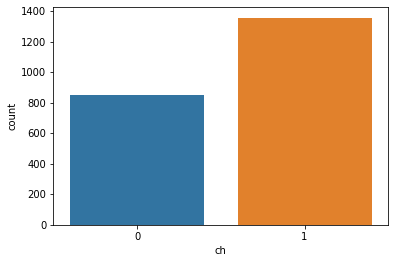

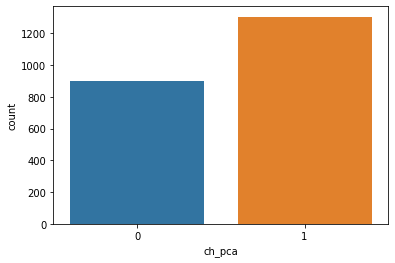

In [78]:
sns.countplot(x=df_filtered_["ch"])
plt.figure()
sns.countplot(x=df_filtered_["ch_pca"])

In [79]:
print('Número de amostras classificadas igualmente para o experimento baseline e o usando PCA:', np.sum(df_filtered_["ch"] == df_filtered_["ch_pca"]), 'de um total de', len(df_filtered_.index))
print('Apenas', str(len(df_filtered_.index) - np.sum(df_filtered_["ch"] == df_filtered_["ch_pca"])), 'foram classificadas diferente.')

Número de amostras classificadas igualmente para o experimento baseline e o usando PCA: 2153 de um total de 2205
Apenas 52 foram classificadas diferente.


O agrupamento realizado usando componantes principais parece ter concentrado mais itens em um cluster, quando comparado aos demais do mesmo experimento. Já para os dados originais, a diferença entre o número de itens do menor e maior clusters é menor.

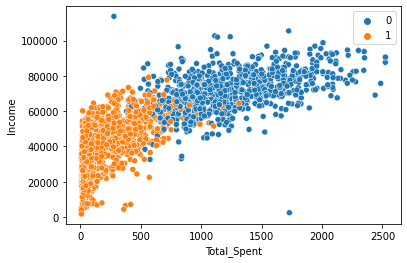

In [80]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["ch"])
plt.legend()

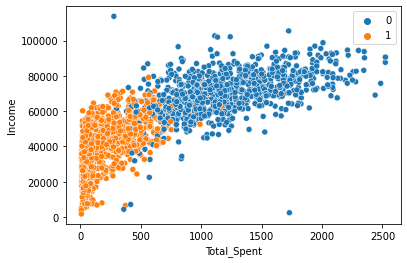

In [81]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["ch_pca"])
plt.legend()

Apesar da diferença notada ao rodar o comando `value_counts`, os dois experimentos tem resultados parecidos ao se realizar uma comparação visual dos clusters resultantes.

### Looking closely at the soft clustering

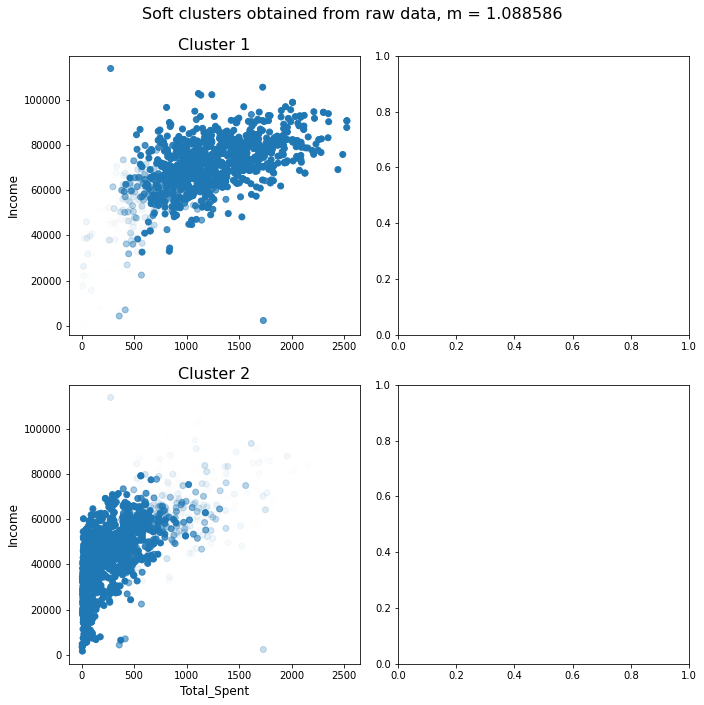

In [82]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained from raw data, m = %f' % models[0].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c1'], label='cluster 1')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 1', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c2'], label='cluster 2')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 2', fontsize=16)
# ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_3'], label='cluster 3')
# ax1[1].set_title('Cluster 3', fontsize=16)
# ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_4'], label='cluster 4')
# ax2[1].set_xlabel('Total_Spent', fontsize=12)
# ax2[1].set_title('Cluster 4', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

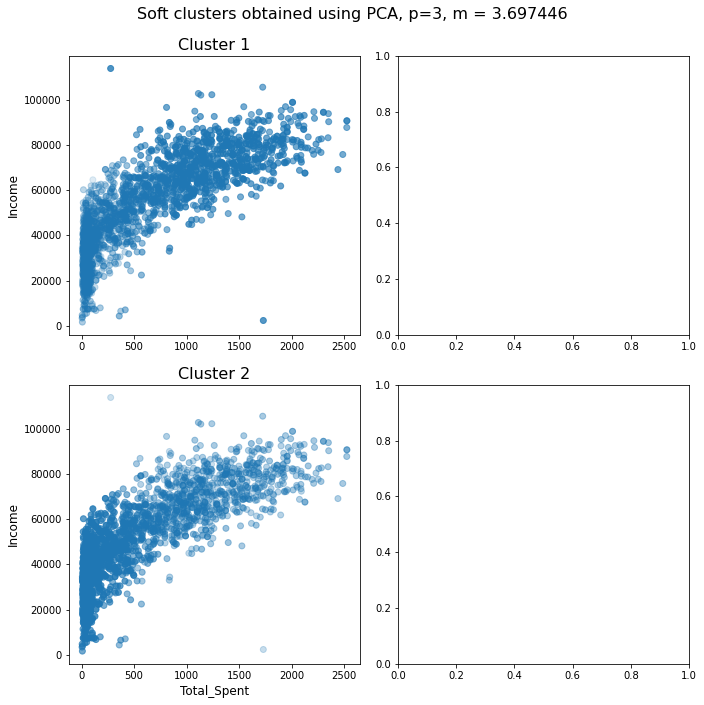

In [83]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained using PCA, p=3, m = %f' % models[1].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c1_pca'])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 1', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c2_pca'])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 2', fontsize=16)
# ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_3_pca'])
# ax1[1].set_title('Cluster 3', fontsize=16)
# ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['c_4_pca'])
# ax2[1].set_xlabel('Total_Spent', fontsize=12)
# ax2[1].set_title('Cluster 4', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

In [84]:
models[0].m, models[1].m

(1.0885862106593263, 3.6974460233452553)

## *** EXPERIMENTO 2: Usando c = 4 (Baseline e PCA, p = 3)

Selecionando os modelos para os quais c = 4:

In [85]:
# Os modelos para os quais c = 4 são correspondetes à terceira posição na lista de modelos fitados para cada experimento.
best_model_1 = models_1[2]
best_model_3 = models_3[2]
models = [best_model_1, best_model_3]
n_clusters = 4
fcm_soft_labels_list = []
fcm_hard_labels_list = []

Aplicando os modelos em todo o conjunto de treinamento (obs.: visualização utilizando apenas as três primeiras componentes):

In [86]:
# conjunto completo com todas as componentes
scaled_df_array = scaled_df_filtered.to_numpy()
# aplicando o PCA fitado nos dados de treino com p = 5 no df inteiro:
reduced_df_array_3 = apply_pca(scaled_df_filtered, number_components=3, pca_fitted=pca_3)[0].to_numpy()
scaled_df_array.shape, reduced_df_array_3.shape

Fitting data using provided PCA object.
     count      mean       std       min       25%       50%       75%  \
c0  2205.0 -0.029351  2.838169 -5.624016 -2.558098 -0.854907  2.302478   
c1  2205.0 -0.010115  1.566937 -3.553542 -1.295151 -0.181817  1.082059   
c2  2205.0  0.020269  1.411735 -2.829502 -1.028010 -0.408993  1.045901   

         max  
c0  8.468760  
c1  5.733883  
c2  6.458822  


/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
/usr/local/lib/python3.7/site-packages/sklearn/base.py:439: UserWarning: X has feature names, but PCA was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


((2205, 29), (2205, 3))

In [87]:
dfs_list = [scaled_df_array, reduced_df_array_3]

In [88]:
for (i, model, df) in zip([1, 2], models, dfs_list):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    fcm_centers = model.centers
    fcm_labels = model.predict(df)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(df)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 1
n_clusters = 4, PC = 0.225, PEC = 0.064
i: 2
n_clusters = 4, PC = 0.072, PEC = 0.473


O primeiro passo é combinar as saídas obtidas com os dados originais.

In [89]:
df_filtered_ = df_filtered.copy()

In [90]:
cluster_0 = fcm_soft_labels_list[0][:,0]
cluster_1 = fcm_soft_labels_list[0][:,1]
cluster_2 = fcm_soft_labels_list[0][:,2]
cluster_3 = fcm_soft_labels_list[0][:,3]
cluster_label = fcm_hard_labels_list[0]
df_filtered_["fuzzy_c0"] = cluster_0
df_filtered_["fuzzy_c1"] = cluster_1
df_filtered_["fuzzy_c2"] = cluster_2
df_filtered_["fuzzy_c3"] = cluster_3
df_filtered_["fuzzy_ch"] = cluster_label

In [91]:
cluster_0 = fcm_soft_labels_list[1][:,0]
cluster_1 = fcm_soft_labels_list[1][:,1]
cluster_2 = fcm_soft_labels_list[1][:,2]
cluster_3 = fcm_soft_labels_list[1][:,3]
cluster_label = fcm_hard_labels_list[1]
df_filtered_["fuzzy_c0_pca"] = cluster_0
df_filtered_["fuzzy_c1_pca"] = cluster_1
df_filtered_["fuzzy_c2_pca"] = cluster_2
df_filtered_["fuzzy_c3_pca"] = cluster_3
df_filtered_["fuzzy_ch_pca"] = cluster_label
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c0,fuzzy_c1,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca
1226,4,0,61284.0,0,0,76,618,15,106,20,...,0.003637,0.975385,2.780998e-03,1.819683e-02,1,0.237188,0.342139,0.234337,0.186336,1
336,2,2,75693.0,0,0,10,797,153,293,72,...,0.000116,0.010335,1.641545e-04,9.893848e-01,3,0.333250,0.264488,0.210227,0.192035,0
2064,2,4,67445.0,0,1,63,757,80,217,29,...,0.000002,0.999774,2.682980e-07,2.237993e-04,1,0.260602,0.349223,0.214424,0.175751,1
1920,1,0,31878.0,0,1,7,23,4,5,10,...,0.624903,0.000743,3.743501e-01,3.632121e-06,0,0.147092,0.185193,0.281029,0.386686,3
2046,2,4,53154.0,0,1,50,129,0,21,0,...,0.998247,0.000157,1.596203e-03,2.766263e-08,0,0.142391,0.202984,0.329305,0.325321,2


In [92]:
df_filtered_.fuzzy_ch.value_counts()

2    602
1    580
0    522
3    501
Name: fuzzy_ch, dtype: int64

In [93]:
df_filtered_.fuzzy_ch_pca.value_counts()

3    759
0    521
2    464
1    461
Name: fuzzy_ch_pca, dtype: int64

<AxesSubplot:xlabel='fuzzy_ch_pca', ylabel='count'>

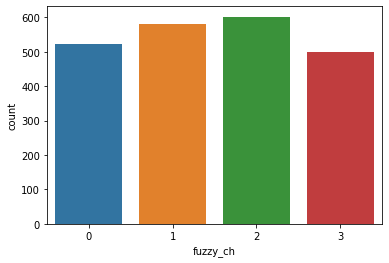

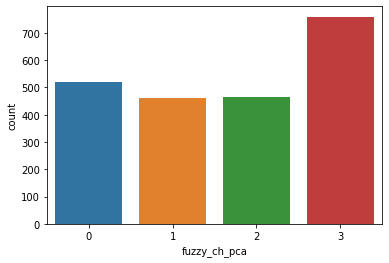

In [94]:
sns.countplot(x=df_filtered_["fuzzy_ch"])
plt.figure()
sns.countplot(x=df_filtered_["fuzzy_ch_pca"])

O agrupamento realizado usando os addos originais concentra muitas amostras no cluster de número 2, com 984 amostras. Para os dados com PCA, o maior cluster apresenta 737 dados e há um gap menor observado entre ele e os demais conjuntos.

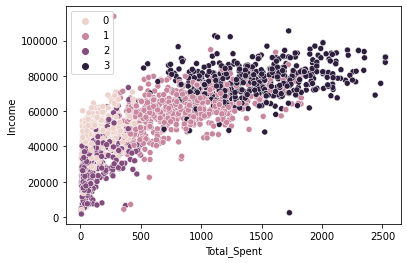

In [95]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch"])
plt.legend()

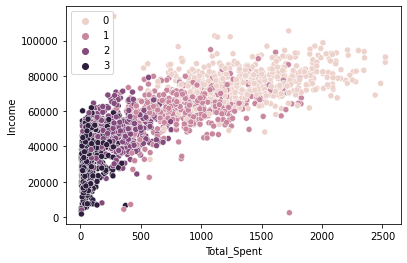

In [96]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["fuzzy_ch_pca"])
plt.legend()

Analisando visualmente os dois gráficos, três clusters sugeridos por ambos experimentos parecem ser parecidos com relação às variáveis analisadas. Porém, nota-se uma diferença relevante entre o cluster de número no experimento com dados originais e o mesmo para o com dados que utiliza PCA.
O que utiliza os dados originais agrupa os clientes com maior Income (aprox. maior que 80000) e Total_Spent (aprox. maior que 750) em um grupo diferente. Já para o agrupamento realizado usando dados do PCA, esse grupo não existe, e o algoritmo sugere um grupo de clientes na transição entre os clusters 2 e 3.

### Looking closely at the soft clustering

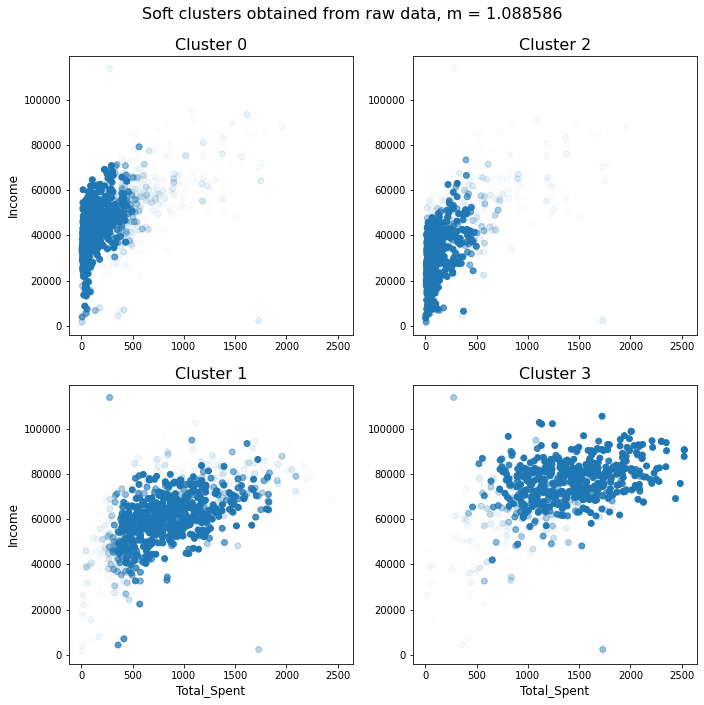

In [97]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained from raw data, m = %f' % models[0].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c0'], label='cluster 1')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c1'], label='cluster 2')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c2'], label='cluster 3')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c3'], label='cluster 4')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

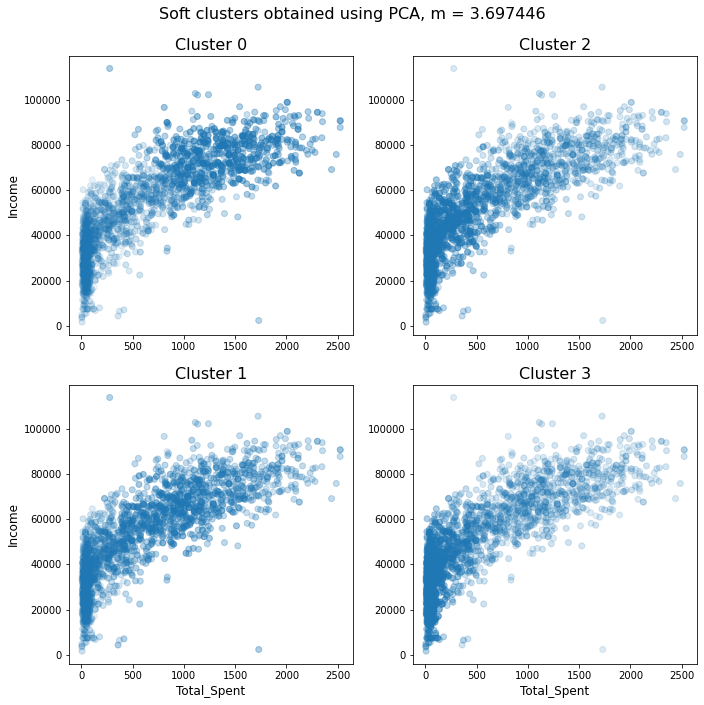

In [98]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Soft clusters obtained using PCA, m = %f' % models[1].m, fontsize=16)
ax1[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c0_pca'])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c1_pca'])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c2_pca'])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], alpha=df_filtered_['fuzzy_c3_pca'])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

Nota-se maior nebulosidade na partição de dados realizada usando PCA (segundo gráfico). Os clusters gerados com os dados originais apresentam valores mais "crisps": a maioria dos connjuntos parecem ser formados por amostras com valor próximo de 1.0, e uma minoria possui valores de pertinência mais baixos, geralmente em regiões de borda.

In [99]:
models[0].m, models[1].m

(1.0885862106593263, 3.6974460233452553)

## "EXTRA": Avaliando a influência do parâmetro m

### Usando c = 2, p = 3

In [100]:
print('Estimated m_3:', m_3)

Estimated m_3: 3.6974460233452553


In [101]:
n_clusters = 2
p = 3
fcm_soft_labels_list = []
fcm_hard_labels_list = []
pc_list_2 = []
pec_list_2 = []
m_list = np.arange(1.0, m_3, 0.25)
m_list

array([1.  , 1.25, 1.5 , 1.75, 2.  , 2.25, 2.5 , 2.75, 3.  , 3.25, 3.5 ])

In [102]:
models_ = list()
for m_i in m_list:
    fcm = FCM(n_clusters = n_clusters, m = m_i, error=eps)
    fcm.fit(reduced_df_np_3)
    models_.append(fcm)

/usr/local/lib/python3.7/site-packages/fcmeans/main.py:58: RuntimeWarning: divide by zero encountered in double_scalars
  temp = FCM._dist(X, self._centers) ** float(2 / (self.m - 1))


In [103]:
for (m_i, model) in zip(m_list, models_):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    pc_list_2.append(pc)
    pec_list_2.append(pec)
    fcm_centers = model.centers
    fcm_labels = model.predict(reduced_df_np_test_3)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(reduced_df_np_test_3)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 2
n_clusters = 2, PC = nan, PEC = nan
i: 2
n_clusters = 2, PC = 0.478, PEC = 0.055
i: 2
n_clusters = 2, PC = 0.447, PEC = 0.133
i: 2
n_clusters = 2, PC = 0.410, PEC = 0.218
i: 2
n_clusters = 2, PC = 0.377, PEC = 0.287
i: 2
n_clusters = 2, PC = 0.349, PEC = 0.339
i: 2
n_clusters = 2, PC = 0.328, PEC = 0.377
i: 2
n_clusters = 2, PC = 0.312, PEC = 0.405
i: 2
n_clusters = 2, PC = 0.299, PEC = 0.425
i: 2
n_clusters = 2, PC = 0.290, PEC = 0.439
i: 2
n_clusters = 2, PC = 0.283, PEC = 0.451


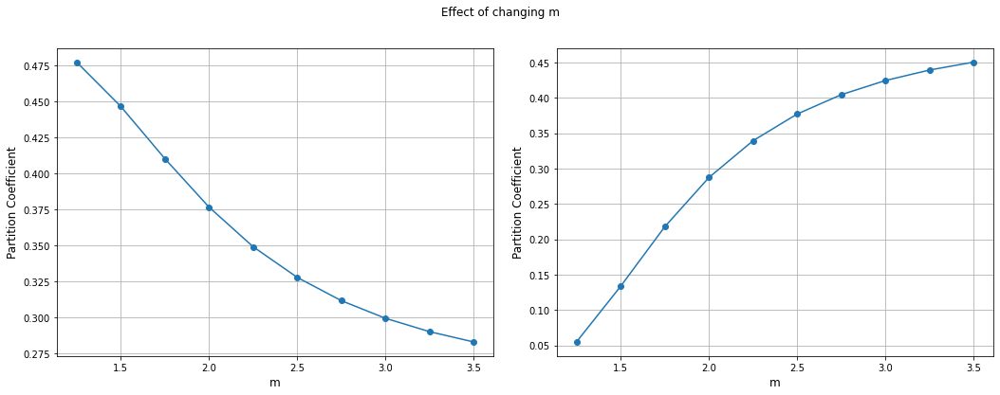

In [104]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_2, marker="o")
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_2, marker="o")
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

### Usando c = 4, p = 3

In [105]:
n_clusters = 4
fcm_soft_labels_list = []
fcm_hard_labels_list = []
pc_list_4 = []
pec_list_4 = []

In [106]:
models_ = list()
for m_i in m_list:
    fcm = FCM(n_clusters = n_clusters, m = m_i, error=eps)
    fcm.fit(reduced_df_np_3)
    models_.append(fcm)

/usr/local/lib/python3.7/site-packages/fcmeans/main.py:58: RuntimeWarning: divide by zero encountered in double_scalars
  temp = FCM._dist(X, self._centers) ** float(2 / (self.m - 1))


In [107]:
for (m_i, model) in zip(m_list, models_):
    print('i:', i)
    pc = model.partition_coefficient
    pec = model.partition_entropy_coefficient
    pc_list_4.append(pc)
    pec_list_4.append(pec)
    fcm_centers = model.centers
    fcm_labels = model.predict(reduced_df_np_test_3)
    fcm_hard_labels_list.append(fcm_labels)
    fcm_soft_labels = model.soft_predict(reduced_df_np_test_3)
    fcm_soft_labels_list.append(fcm_soft_labels)
    print(f'n_clusters = {n_clusters}, PC = {pc:.3f}, PEC = {pec:.3f}')

i: 2
n_clusters = 4, PC = nan, PEC = nan
i: 2
n_clusters = 4, PC = 0.226, PEC = 0.064
i: 2
n_clusters = 4, PC = 0.186, PEC = 0.170
i: 2
n_clusters = 4, PC = 0.153, PEC = 0.263
i: 2
n_clusters = 4, PC = 0.126, PEC = 0.332
i: 2
n_clusters = 4, PC = 0.108, PEC = 0.379
i: 2
n_clusters = 4, PC = 0.096, PEC = 0.411
i: 2
n_clusters = 4, PC = 0.088, PEC = 0.433
i: 2
n_clusters = 4, PC = 0.082, PEC = 0.448
i: 2
n_clusters = 4, PC = 0.077, PEC = 0.460
i: 2
n_clusters = 4, PC = 0.074, PEC = 0.468


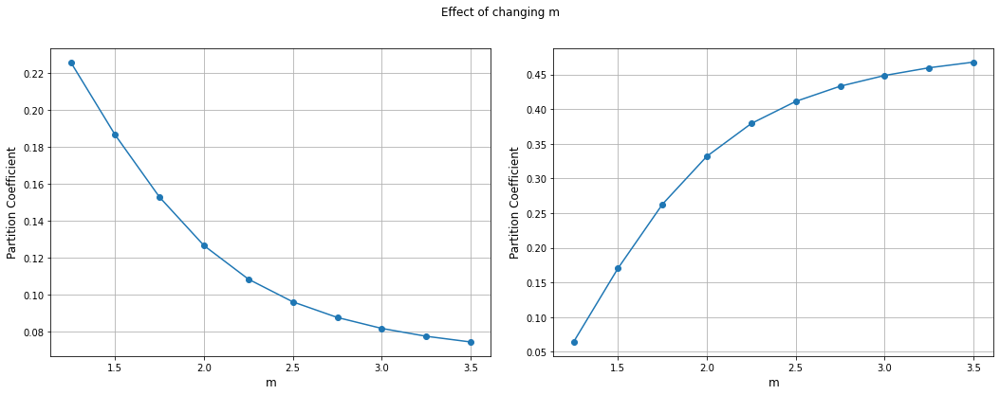

In [108]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_4, marker="o")
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_4, marker="o")
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

### Comparando

Juntando ambos plots:

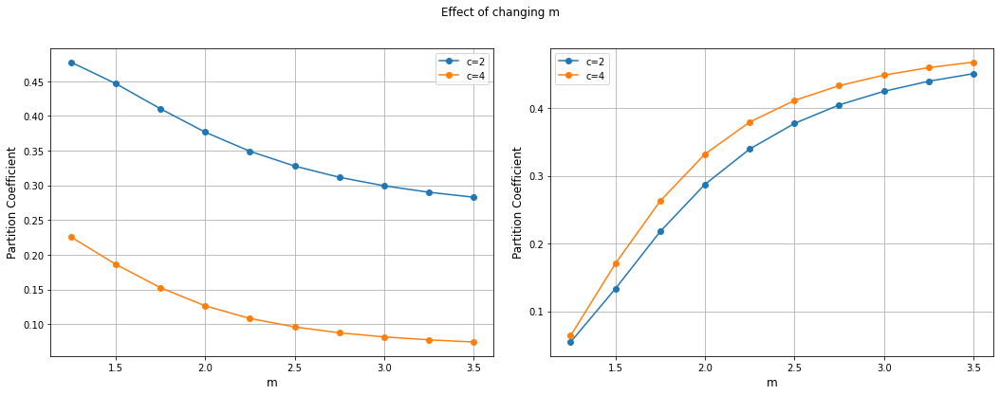

In [109]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,6))
plt.suptitle('Effect of changing m')
ax1.plot(m_list, pc_list_2, marker="o", label='c=2')
ax1.plot(m_list, pc_list_4, marker="o", label='c=4')
ax1.set_xlabel('m', fontsize=12)
ax1.set_ylabel('Partition Coefficient', fontsize=12)
ax1.grid(True)
ax2.plot(m_list, pec_list_2, marker="o", label='c=2')
ax2.plot(m_list, pec_list_4, marker="o", label='c=4')
ax2.set_xlabel('m', fontsize=12)
ax2.set_ylabel('Partition Coefficient', fontsize=12)
fig.tight_layout(pad=2)
ax2.grid(True)
ax1.legend()
ax2.legend()
plt.show()

A escolha do coeficiente fuzzy "m" parece parece influenciar mais o resultado quando se utiliza um maior número de clusters.

# K-Means Clustering [c = 4]

Ajuste do K-Means ao conjunto de dados. Utilizando o mesmo número de clusters definido para o FCM.

In [110]:
from sklearn.cluster import KMeans
n_clusters = 4

## *** EXPERIMENTO 3: Baseline

In [111]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(data_train)
kmeans_labels = kmeans.predict(data_test)

In [112]:
kmeans_labels = kmeans.predict(scaled_df_array)

In [113]:
#df_filtered__ = df_filtered.copy()
df_filtered_["kmeans_c"] = kmeans_labels
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c1,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca,kmeans_c
1226,4,0,61284.0,0,0,76,618,15,106,20,...,0.975385,2.780998e-03,1.819683e-02,1,0.237188,0.342139,0.234337,0.186336,1,3
336,2,2,75693.0,0,0,10,797,153,293,72,...,0.010335,1.641545e-04,9.893848e-01,3,0.333250,0.264488,0.210227,0.192035,0,2
2064,2,4,67445.0,0,1,63,757,80,217,29,...,0.999774,2.682980e-07,2.237993e-04,1,0.260602,0.349223,0.214424,0.175751,1,3
1920,1,0,31878.0,0,1,7,23,4,5,10,...,0.000743,3.743501e-01,3.632121e-06,0,0.147092,0.185193,0.281029,0.386686,3,0
2046,2,4,53154.0,0,1,50,129,0,21,0,...,0.000157,1.596203e-03,2.766263e-08,0,0.142391,0.202984,0.329305,0.325321,2,0


/usr/local/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

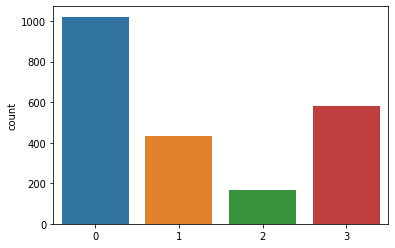

In [114]:
sns.countplot(kmeans_labels)

In [115]:
df_filtered_["kmeans_c"].value_counts()

0    1021
3     583
1     435
2     166
Name: kmeans_c, dtype: int64

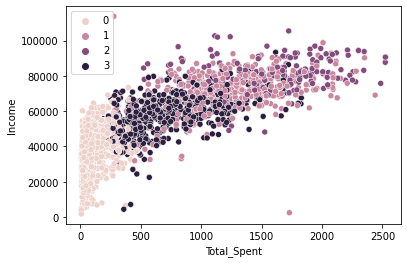

In [116]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c"])
plt.legend()

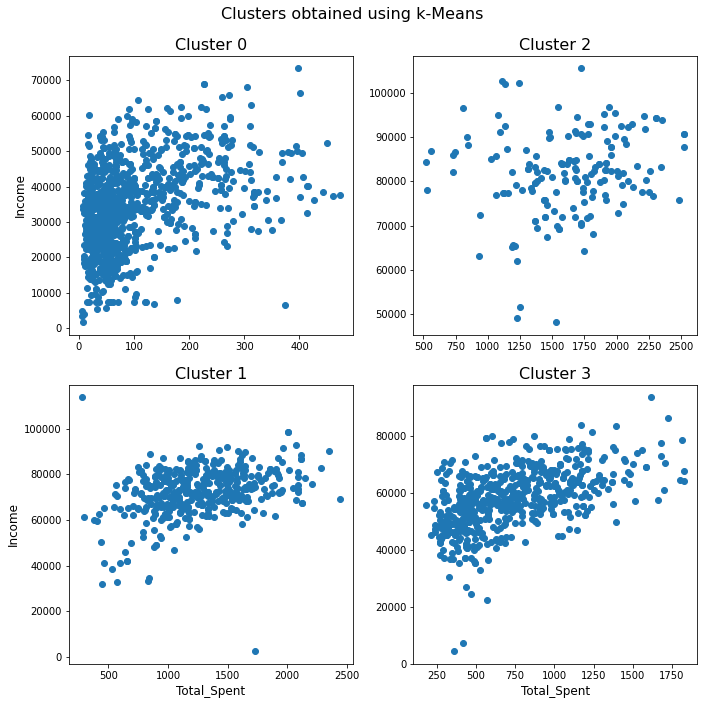

In [117]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0]["Income"])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1]["Income"])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2]["Income"])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3]["Income"])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

## *** EXPERIMENTO 4: PCA, p = 3

In [118]:
kmeans_pca = KMeans(n_clusters=4, random_state=0).fit(reduced_df_np_3)
kmeans_labels = kmeans_pca.predict(reduced_df_np_test_3)

In [119]:
kmeans_labels = kmeans_pca.predict(reduced_df_array_3)

In [120]:
df_filtered_["kmeans_c_pca"] = kmeans_labels
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c2,fuzzy_c3,fuzzy_ch,fuzzy_c0_pca,fuzzy_c1_pca,fuzzy_c2_pca,fuzzy_c3_pca,fuzzy_ch_pca,kmeans_c,kmeans_c_pca
1226,4,0,61284.0,0,0,76,618,15,106,20,...,2.780998e-03,1.819683e-02,1,0.237188,0.342139,0.234337,0.186336,1,3,2
336,2,2,75693.0,0,0,10,797,153,293,72,...,1.641545e-04,9.893848e-01,3,0.333250,0.264488,0.210227,0.192035,0,2,0
2064,2,4,67445.0,0,1,63,757,80,217,29,...,2.682980e-07,2.237993e-04,1,0.260602,0.349223,0.214424,0.175751,1,3,2
1920,1,0,31878.0,0,1,7,23,4,5,10,...,3.743501e-01,3.632121e-06,0,0.147092,0.185193,0.281029,0.386686,3,0,1
2046,2,4,53154.0,0,1,50,129,0,21,0,...,1.596203e-03,2.766263e-08,0,0.142391,0.202984,0.329305,0.325321,2,0,1


In [121]:
df_filtered_["kmeans_c_pca"].value_counts()

1    1004
2     579
3     411
0     211
Name: kmeans_c_pca, dtype: int64

/usr/local/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:ylabel='count'>

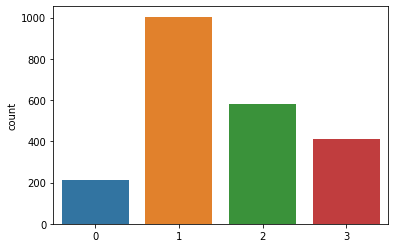

In [122]:
sns.countplot(kmeans_labels)

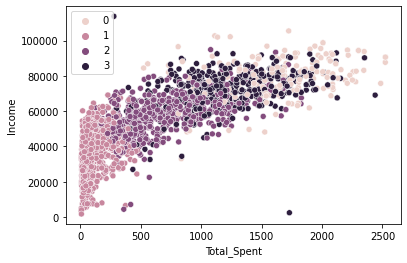

In [123]:
sns.scatterplot(data = df_filtered_, x=df_filtered_["Total_Spent"], y=df_filtered_["Income"], hue=df_filtered_["kmeans_c_pca"])
plt.legend()

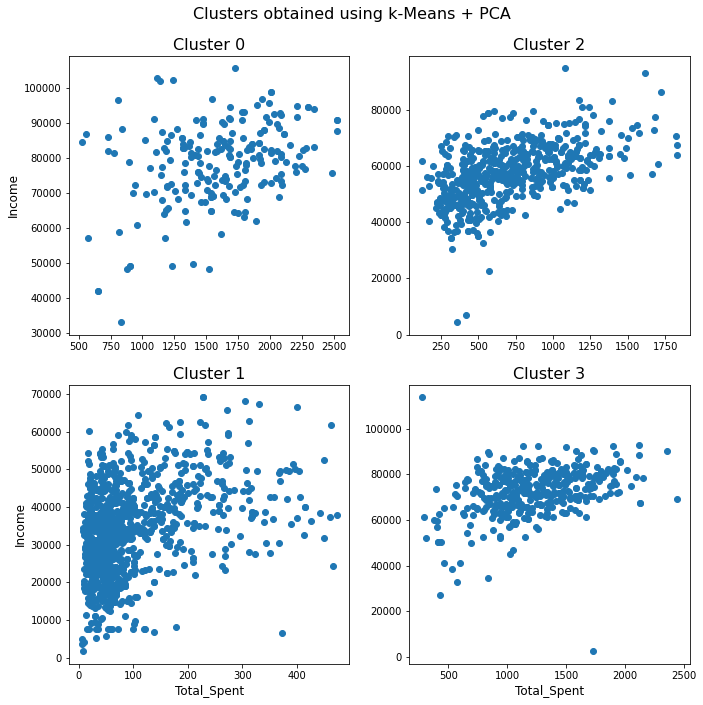

In [124]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means + PCA', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"])
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"])
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"])
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"])
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.tight_layout(pad=1.5)
plt.show()

## Comparação: Baseline e PCA

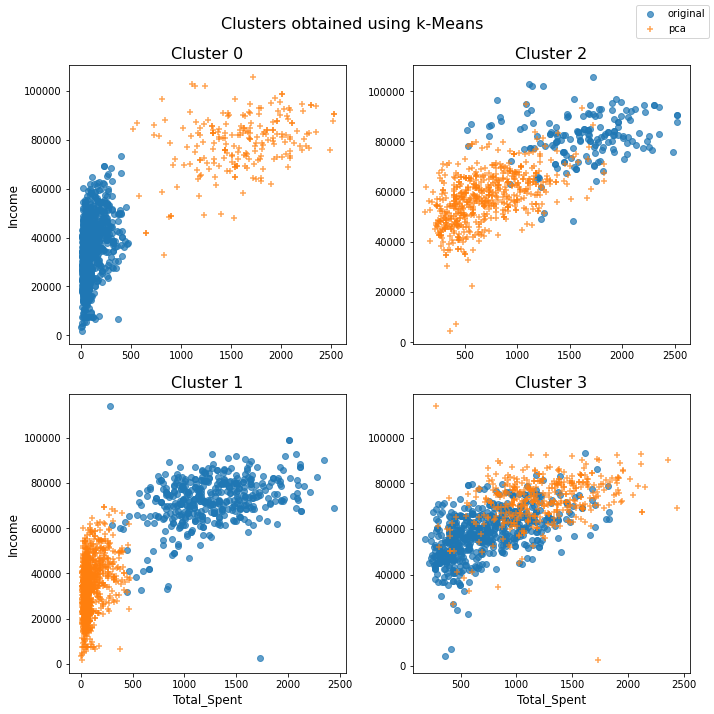

In [125]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=(10,10))
plt.suptitle('Clusters obtained using k-Means', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0]["Income"], label='original', alpha=0.7)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"], label='pca', alpha=0.7, marker='+')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1]["Income"], alpha=0.7)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"], alpha=0.7, marker='+')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2]["Income"], alpha=0.7)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], alpha=0.7, marker='+')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3]["Income"], alpha=0.7)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.7, marker='+')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()

In [126]:
print("Amostras classificadas igualmente:", np.sum(df_filtered_['c_kmeans'] == df_filtered_['c_kmeans_pca']), 'de um total de', len(scaled_df_array))

KeyError: 'c_kmeans'

# Comparação k-Means e Fuzzy C-Means

## Baseline

### Comparação Visual

In [ ]:
df_filtered_.head()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,fuzzy_c4,fuzzy_ch,fuzzy_c1_pca,fuzzy_2_pca,fuzzy_c3_pca,fuzzy_c4_pca,fuzzy_ch_pca,fuzzy_c2_pca,kmeans_c,kmeans_c_pca
1632,4,4,52854.0,1,1,43,105,0,10,0,...,0.004631,2,0.129339,0.379339,0.297613,0.193709,1,0.379339,1,3
1856,3,0,58217.0,2,1,84,68,1,13,3,...,0.015756,2,0.144033,0.346651,0.306942,0.202374,1,0.346651,1,3
2067,4,4,77610.0,0,1,70,1245,33,332,21,...,0.868895,3,0.239079,0.205498,0.163222,0.392201,3,0.205498,2,2
1428,1,0,38741.0,1,1,60,7,10,17,8,...,0.000155,2,0.120735,0.318152,0.396053,0.165060,2,0.318152,1,3
1105,4,0,76045.0,0,0,78,760,53,400,17,...,0.005413,0,0.461214,0.163179,0.147551,0.228055,0,0.163179,0,1


In [ ]:
df_filtered_['fuzzy_ch'].value_counts()

2    984
3    589
0    462
1    170
Name: fuzzy_ch, dtype: int64

In [ ]:
df_filtered_['kmeans_c'].value_counts()

1    983
2    589
0    465
3    168
Name: kmeans_c, dtype: int64

Para o conjunto baseline, o que parece ter acontecido, para cada cluster:

- KM: 0 -> FCM: 0
- KM: 1 -> FCM: 3
- KM: 2 -> FCM: 1
- KM: 3 -> FCM: 2

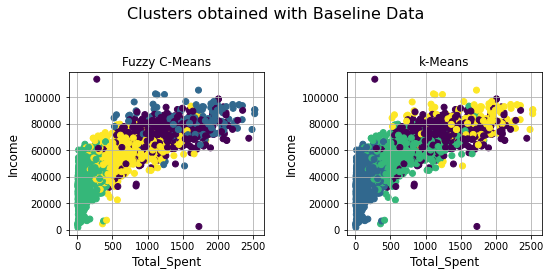

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with Baseline Data', fontsize=16)
ax1.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["fuzzy_ch"])
ax1.set_xlabel('Total_Spent', fontsize=12)
ax1.set_ylabel('Income', fontsize=12)
ax1.set_title('Fuzzy C-Means')
ax1.grid(True)
ax2.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c"])
ax2.set_xlabel('Total_Spent', fontsize=12)
ax2.set_ylabel('Income', fontsize=12)
ax2.set_title('k-Means')
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

Alterando a ordem dos plots para facilitar visualização e comparação dos clusters:

In [ ]:
# - Total_Spent e MntWines
# - Total_Spent e MntMeatProducts
# - Total_Spent e NumCatalogPurchases
# - Total_Spent e Income

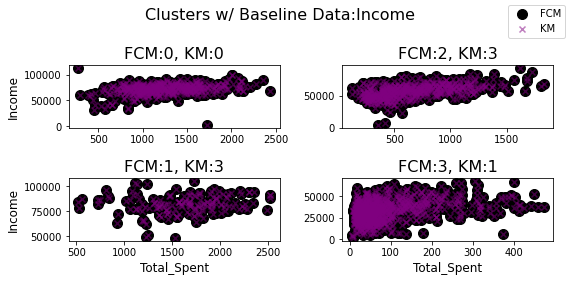

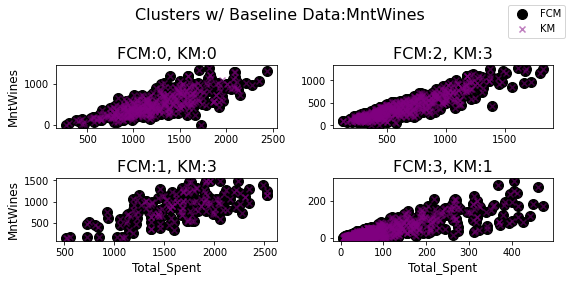

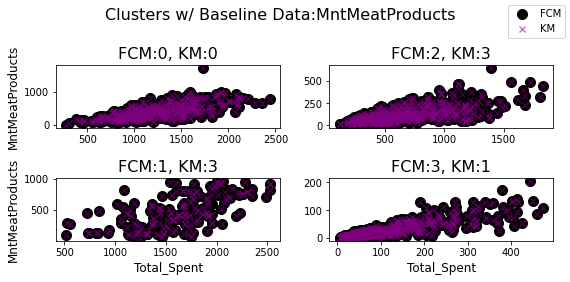

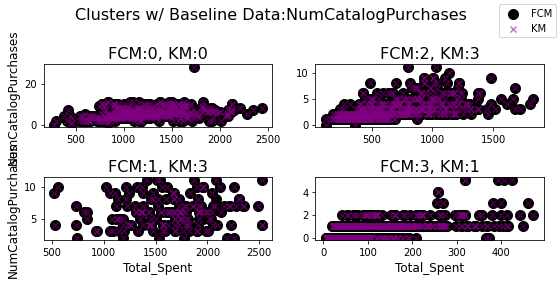

In [ ]:
vars_of_interest = ["Income","MntWines", "MntMeatProducts", "NumCatalogPurchases"]

for var_i in vars_of_interest:
    fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
    plt.suptitle('Clusters w/ Baseline Data:' + var_i, fontsize=16)
    ax1[0].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 0]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 0][var_i], label='FCM', s=100, c='black')
    ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 0][var_i], label='KM', alpha=0.5, marker="x", c='purple')
    ax1[0].set_ylabel(var_i, fontsize=12)
    ax1[0].set_title('FCM:0, KM:0', fontsize=16)
    ax2[0].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 1]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 1][var_i], s=100, c='black')
    ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 3][var_i], alpha=0.5, marker="x", c='purple')
    ax2[0].set_xlabel('Total_Spent', fontsize=12)
    ax2[0].set_ylabel(var_i, fontsize=12)
    ax2[0].set_title('FCM:1, KM:3', fontsize=16)
    ax1[1].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 3]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 3][var_i], s=100, c='black')
    ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 2][var_i], alpha=0.5, marker="x", c='purple')
    ax1[1].set_title('FCM:2, KM:3', fontsize=16)
    ax2[1].scatter(df_filtered_[df_filtered_['fuzzy_ch'] == 2]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch'] == 2][var_i], s=100, c='black')
    ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c'] == 1][var_i], alpha=0.5, marker="x", c='purple')
    ax2[1].set_xlabel('Total_Spent', fontsize=12)
    ax2[1].set_title('FCM:3, KM:1', fontsize=16)
    fig.legend()
    fig.tight_layout(pad=1.5)
    plt.show()

Notamos que há uma grande sobreposição entre os clusters obtidos tanto para o FCM (hard) quanto o K-Means, quando utilizado os dados originais de entrada.

## PCA, p = 3

### Comparação Visual

In [ ]:
df_filtered_['fuzzy_ch_pca'].value_counts()

2    737
0    526
3    473
1    469
Name: fuzzy_ch_pca, dtype: int64

In [ ]:
df_filtered_['kmeans_c_pca'].value_counts()

3    982
2    558
0    466
1    199
Name: kmeans_c_pca, dtype: int64

Ao utilizar o PCA, os resultados obtidos para cada método divergem mais.

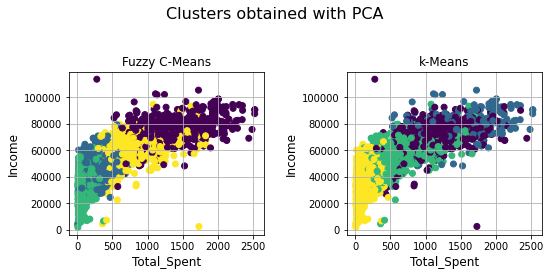

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA', fontsize=16)
ax1.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["fuzzy_ch_pca"])
ax1.set_xlabel('Total_Spent', fontsize=12)
ax1.set_ylabel('Income', fontsize=12)
ax1.set_title('Fuzzy C-Means')
ax1.grid(True)
ax2.scatter(df_filtered_["Total_Spent"], df_filtered_["Income"], c=df_filtered_["kmeans_c_pca"])
ax2.set_xlabel('Total_Spent', fontsize=12)
ax2.set_ylabel('Income', fontsize=12)
ax2.set_title('k-Means')
fig.tight_layout(pad=2)
ax2.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


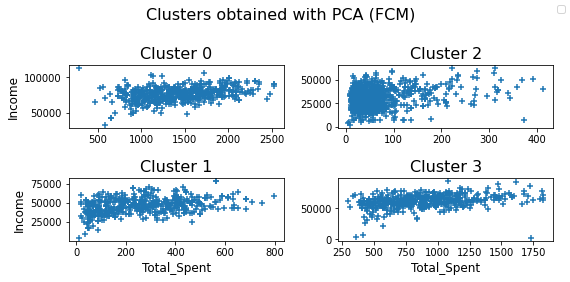

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA (FCM)', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 0]["Income"],  marker='+')
# ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], label='KM', alpha=0.5, marker="+")
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 1]["Income"], marker='+')
# ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 2]["Income"], marker='+')
# ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['fuzzy_ch_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['fuzzy_ch_pca'] == 3]["Income"], marker='+')
# ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], alpha=0.5, marker="+")
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


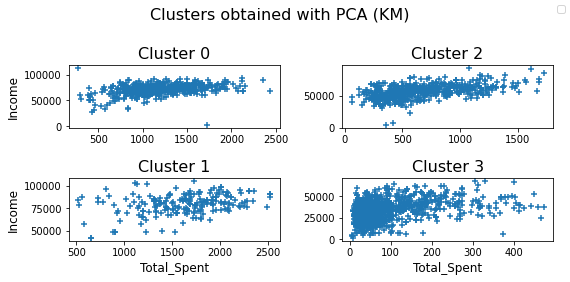

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 2, figsize=plt.figaspect(0.5))
plt.suptitle('Clusters obtained with PCA (KM)', fontsize=16)
ax1[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 0]["Income"], marker='+')
ax1[0].set_ylabel('Income', fontsize=12)
ax1[0].set_title('Cluster 0', fontsize=16)
ax2[0].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 1]["Income"], marker='+')
ax2[0].set_xlabel('Total_Spent', fontsize=12)
ax2[0].set_ylabel('Income', fontsize=12)
ax2[0].set_title('Cluster 1', fontsize=16)
ax1[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 2]["Income"], marker='+')
ax1[1].set_title('Cluster 2', fontsize=16)
ax2[1].scatter(df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Total_Spent"], df_filtered_[df_filtered_['kmeans_c_pca'] == 3]["Income"], marker='+')
ax2[1].set_xlabel('Total_Spent', fontsize=12)
ax2[1].set_title('Cluster 3', fontsize=16)
fig.legend()
fig.tight_layout(pad=1.5)
plt.show()